### Quick start guide

In this guide you will download a sample dataset, train a model using Syngen and generate a synthetic data using trained model.

In [85]:
import requests
import pandas as pd

In [82]:
dataset = requests.get("https://raw.githubusercontent.com/tdspora/syngen/main/example-data/housing.csv")

In [89]:
with open("sample-dataset.csv", "w+") as file:
    file.write(dataset.content.decode("utf-8"))

Since syngen is a command-line tool, we will invoke it's commands in a command line mode of jupyter.

First of all, let's install the latest version of Syngen

In [102]:
%%cmd

python.exe -m pip install --upgrade pip
pip3 install syngen

Microsoft Windows [Version 10.0.19044.2251]
(c) Microsoft Corporation. All rights reserved.

C:\Users\Pavel_Bobyrev>
C:\Users\Pavel_Bobyrev>python.exe -m pip install --upgrade pip

C:\Users\Pavel_Bobyrev>pip3 uninstall syngen -y
Found existing installation: syngen 0.0.41
Uninstalling syngen-0.0.41:
  Successfully uninstalled syngen-0.0.41

C:\Users\Pavel_Bobyrev>

Then we will invoke the training process using the default parameters. All you need to specify is the path to your table and an arbitrary name for the table. It may take some time to train a model depending on your computer capabilities. You can track the progress in the output section of the cell.

In [128]:
%%cmd

train --source "./sample-dataset.csv" --table_name "housing" --epochs 5

Microsoft Windows [Version 10.0.19044.2251]
(c) Microsoft Corporation. All rights reserved.

C:\Users\Pavel_Bobyrev>
C:\Users\Pavel_Bobyrev>train --source "./sample-dataset.csv" --table_name "housing" --epochs 5


2022-11-28 13:21:21.873 | INFO     | syngen.ml.worker.worker:__train_table:186 - Training process of the table - housing has started.
2022-11-28 13:21:21.899 | INFO     | syngen.ml.interface.interface:run:147 - Generator: 'vae', mode: 'train'
2022-11-28 13:21:21.900 | DEBUG    | syngen.ml.strategies.strategies:run:27 - Train model with parameters: epochs=5, drop_null=False
2022-11-28 13:21:22.090 | DEBUG    | syngen.ml.pipeline.pipeline:data_pipeline:128 - Count of string columns: 0; Count of float columns: 3; Count of int columns: 6; Count of categorical columns: 1; Count of date columns: 0; Count of binary columns: 0
2022-11-28 13:21:30.370 | INFO     | syngen.ml.reporters.reporters:report:158 - Corresponding plot pickle files regarding to sampled data accuracy test were saved to folder 'model_artifacts/tmp_store/housing/draws/'.
2022-11-28 13:21:30.370 | INFO     | syngen.ml.train_chain.train_chain:__fit_model:120 - Start VAE training
2022-11-28 13:21:30.422 | DEBUG    | syngen.ml.p


C:\Users\Pavel_Bobyrev>

When the training is complited you should see the log message "Training of the table - housing was complited".

The next step is to utilize the trained model to generate synthetic data. To do this we will invoke the infer command specifying two mandatory parameters - the size of output table and the name. Please notice that the name should match the one you used in the training process. Also we will enable the "print_report" option to visually assess the quality of generated data later.

In [129]:
%%cmd

infer --size 10000 --table_name "housing" --print_report true

Microsoft Windows [Version 10.0.19044.2251]
(c) Microsoft Corporation. All rights reserved.

C:\Users\Pavel_Bobyrev>
C:\Users\Pavel_Bobyrev>infer --size 10000 --table_name "housing" --print_report true


2022-11-28 13:41:36.644 | INFO     | syngen.ml.worker.worker:__infer_table:208 - Infer process of the table - housing has started.
2022-11-28 13:41:36.644 | INFO     | syngen.ml.train_chain.train_chain:handle:282 - Total of 1 batch(es)
2022-11-28 13:41:36.645 | INFO     | syngen.ml.train_chain.train_chain:run:204 - Start data synthesis
2022-11-28 13:41:46.494 | INFO     | syngen.ml.vae.wrappers.wrappers:load_state:291 - Loaded VAE state from model_artifacts/resources/housing/vae/checkpoints
2022-11-28 13:41:46.521 | INFO     | syngen.ml.vae.wrappers.wrappers:load_state:291 - Loaded VAE state from model_artifacts/resources/housing/vae/checkpoints
2022-11-28 13:41:46.563 | INFO     | syngen.ml.vae.wrappers.wrappers:load_state:291 - Loaded VAE state from model_artifacts/resources/housing/vae/checkpoints
2022-11-28 13:41:46.581 | INFO     | syngen.ml.vae.wrappers.wrappers:load_state:291 - Loaded VAE state from model_artifacts/resources/housing/vae/checkpoints
2022-11-28 13:41:46.615 | INFO

Median of Jensen Shannon Distance heatmap is 0.880
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_population.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_median_income.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_housing_median_age.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_median_house_value.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_total_rooms.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_longitude.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_total_bedrooms.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_ocean_proximity.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_latitude_households.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_population_median_income.png
model_artifacts/tmp_store/housing/draws/accuracy/bivariate_population_housing_median_a

When the inference process is completed you will see the log message "Synthesis of the table - housing was complited. Synthetic data saved in model_artifacts/tmp_store/housing/merged_infer_housing.csv".

That's it! You can find the generated table in the path mentioned above. Let's take a quick glance on the data generated using pandas/

In [130]:
import pandas as pd
pd.read_csv("./model_artifacts/tmp_store/housing/merged_infer_housing.csv")

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-120.342522,35.440933,20,4601,535,1719,645,4.527146,221401,<1H OCEAN
1,-120.645821,36.079960,20,2300,503,1585,408,2.619239,142931,INLAND
2,-120.314865,35.439339,20,4618,541,1732,647,4.534196,222444,<1H OCEAN
3,-120.631119,36.085896,20,2300,505,1594,408,2.604307,142711,INLAND
4,-120.300041,35.444633,20,4656,541,1739,649,4.548986,223238,<1H OCEAN
...,...,...,...,...,...,...,...,...,...,...
9995,-120.614136,36.094021,20,2309,508,1604,409,2.583383,142510,INLAND
9996,-120.292870,35.445881,20,4656,542,1743,649,4.552632,223526,<1H OCEAN
9997,-119.006409,35.438015,21,2672,842,1754,469,3.774939,226072,NEAR OCEAN
9998,-120.386375,35.414967,20,4454,539,1690,640,4.463951,218643,<1H OCEAN


The data looks quite plausible. However, if you want to dive deeper in the quality assessment, follow the notebook to the subsequent section.

### Synthetic data quality report

If the "print report" flag was enabled during the inference process, the process will generate an html report. Let's see how it looks.

,Type,Synth_to_orig_ratio,variable,value
0,Multiclass (ocean_proximity,1.299,Orig,0.635674
1,Regression (total_bedrooms,-0.053,Orig,0.985768
2,Multiclass (ocean_proximity,1.299,Synth,0.489272
3,Regression (total_bedrooms,-0.053,Synth,-18.751452

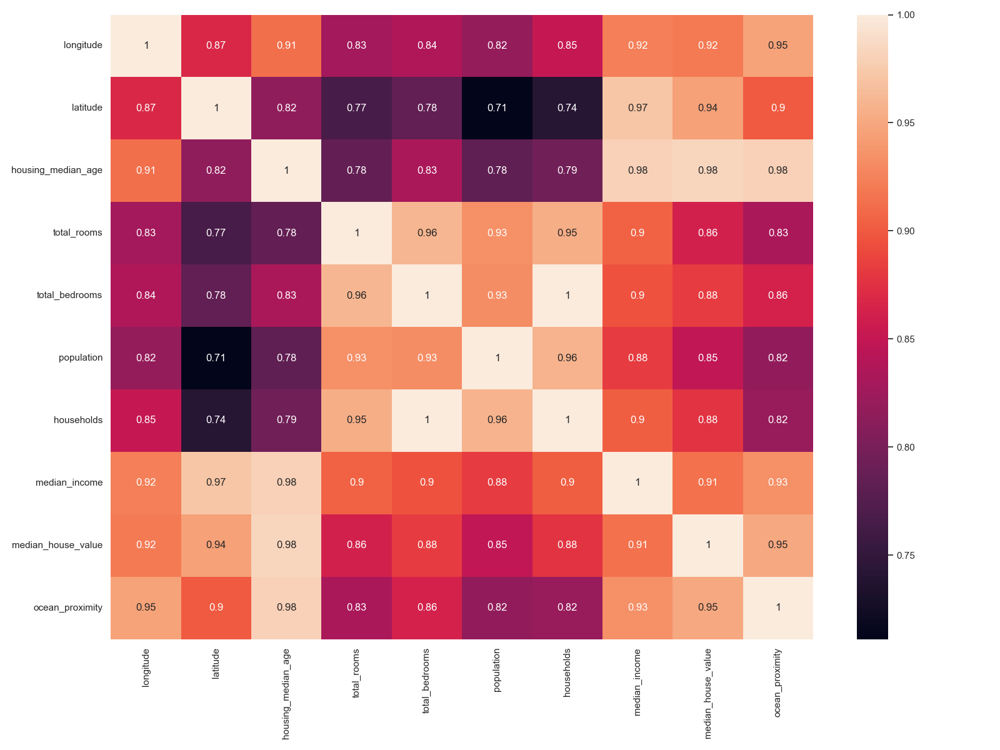
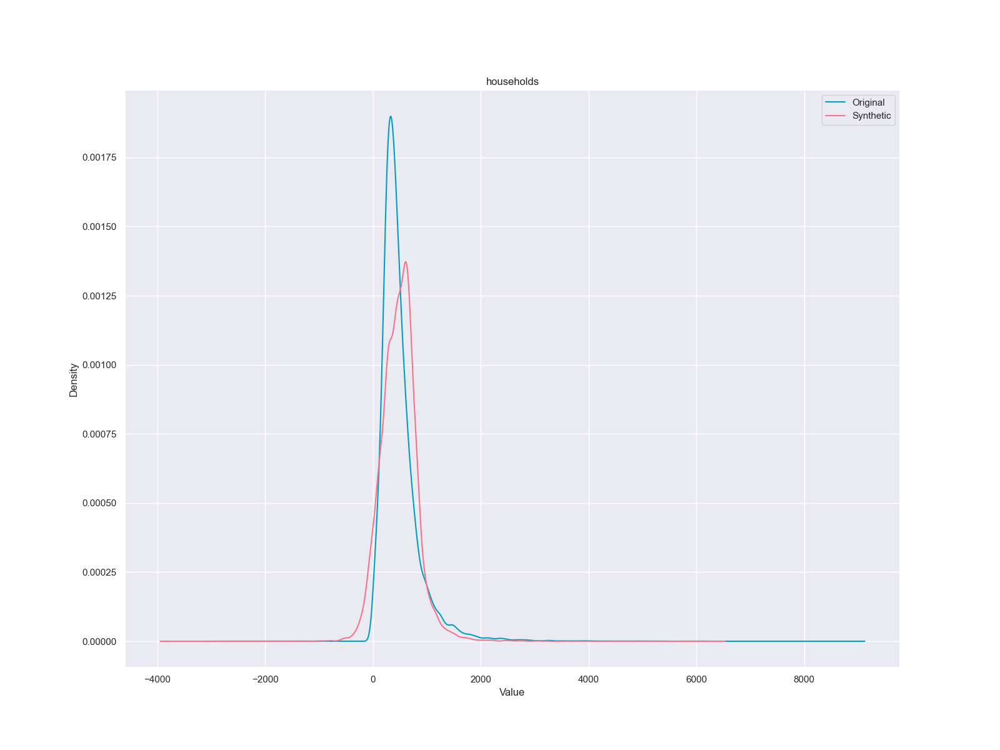
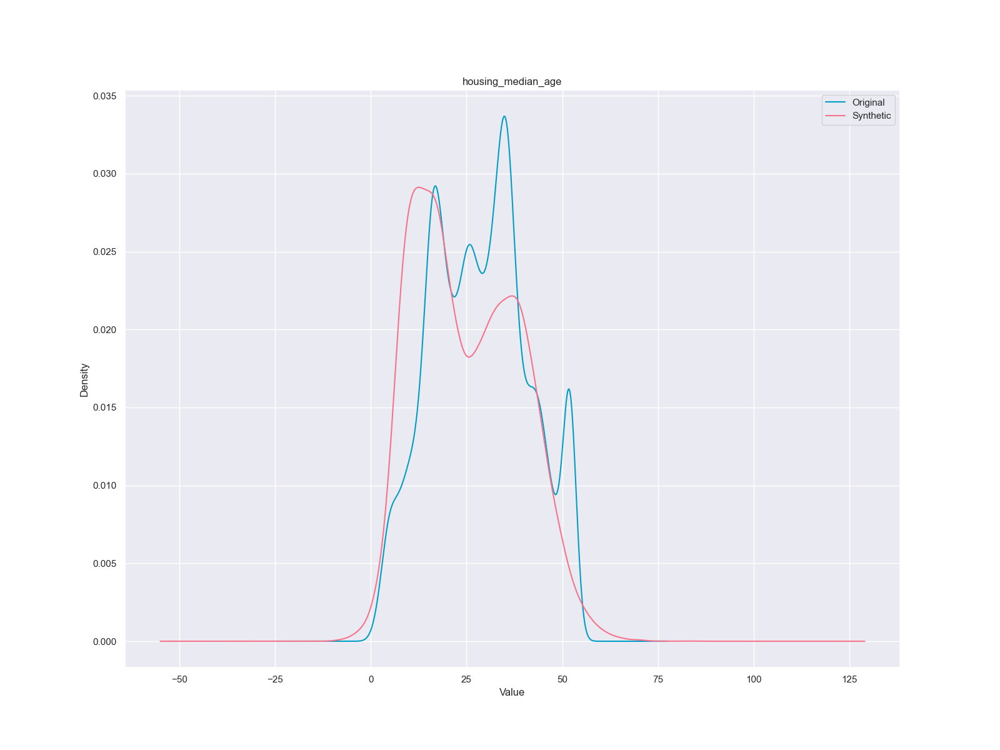
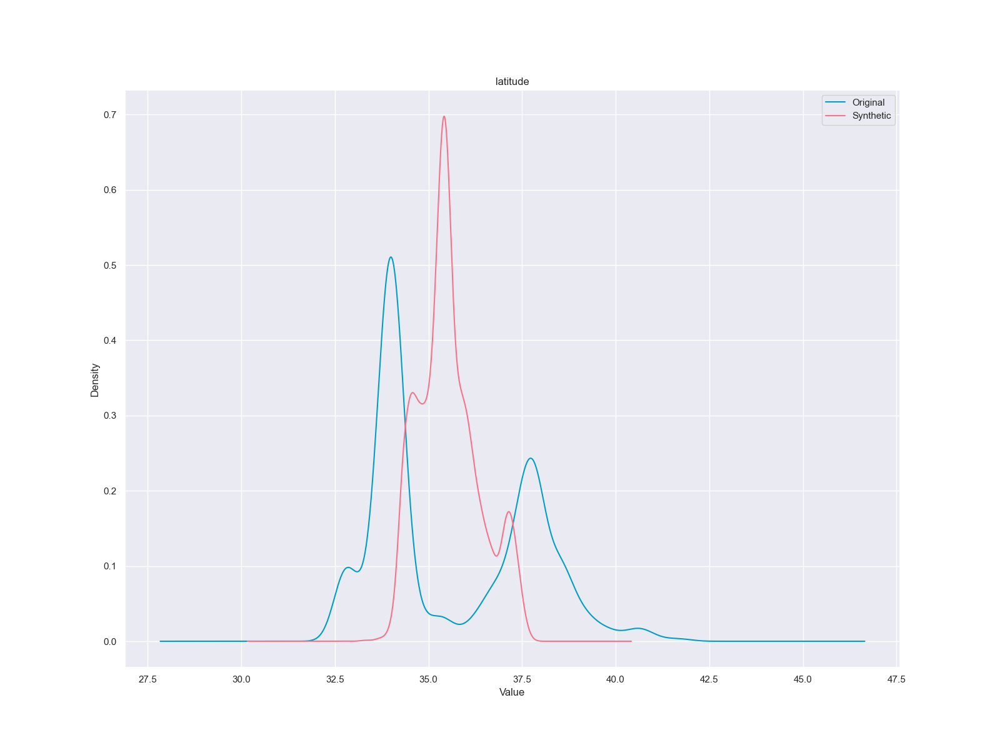
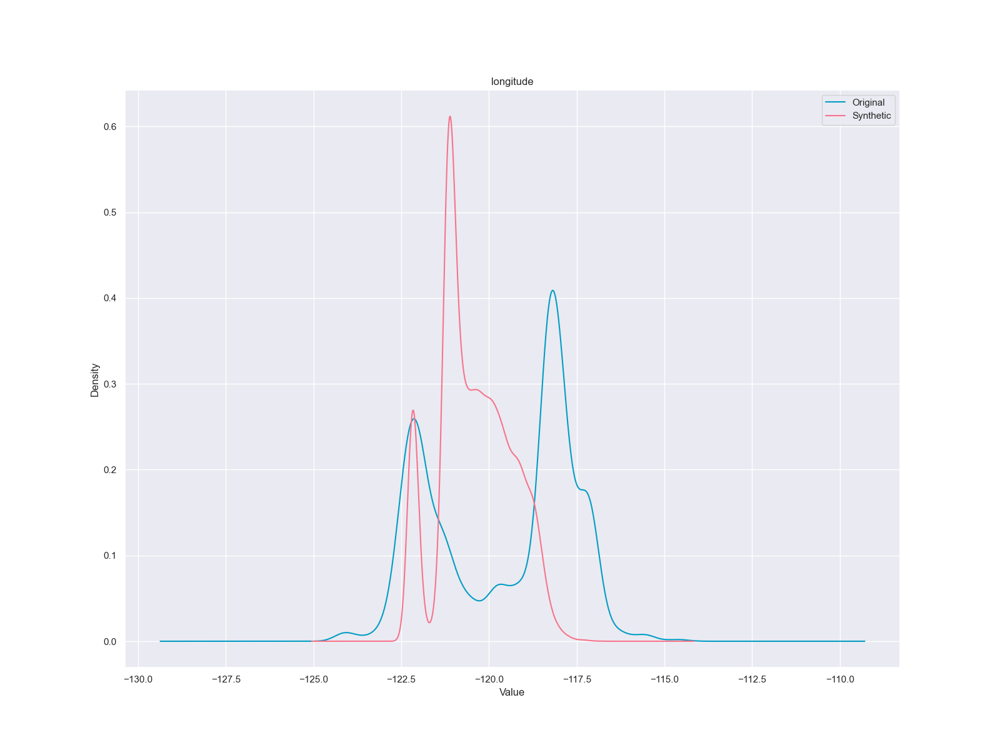
...
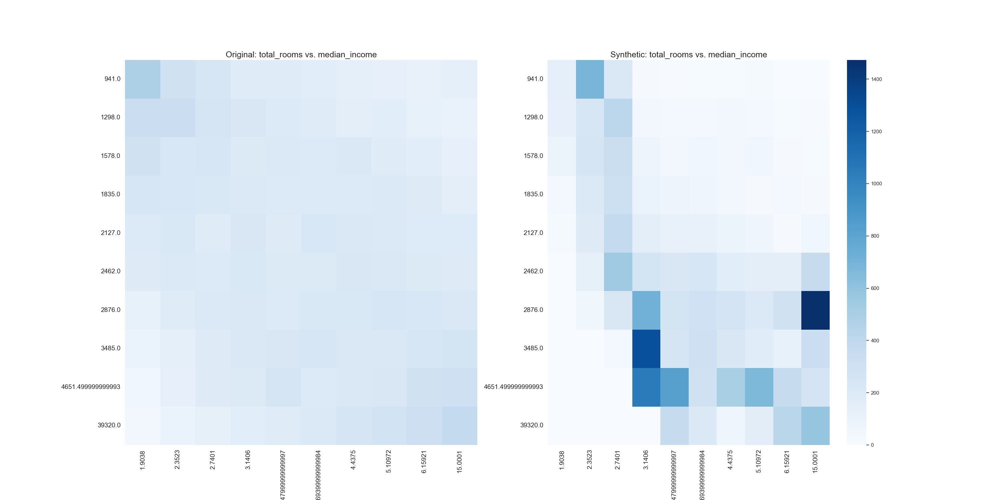
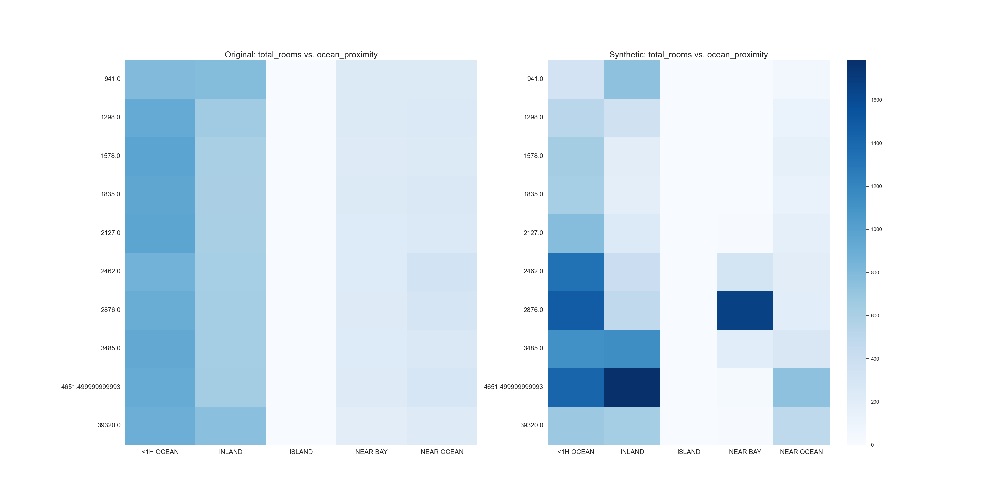
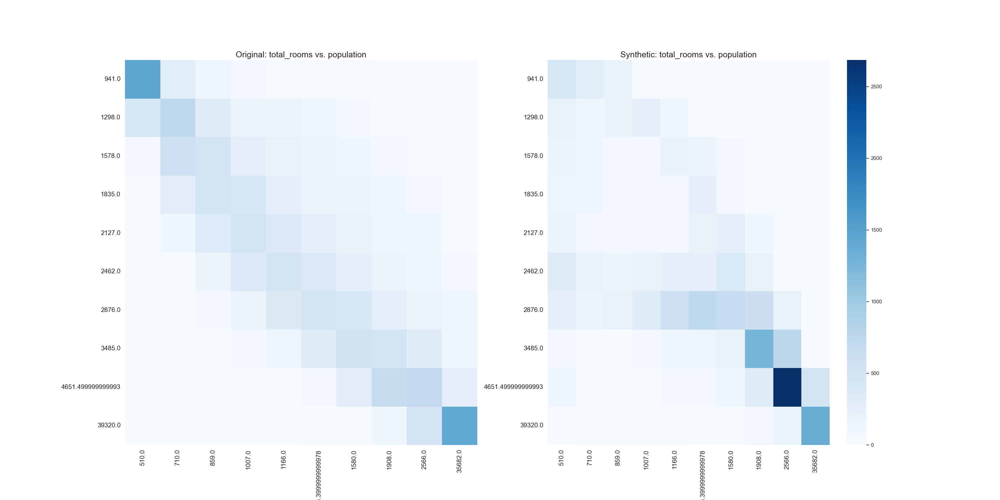
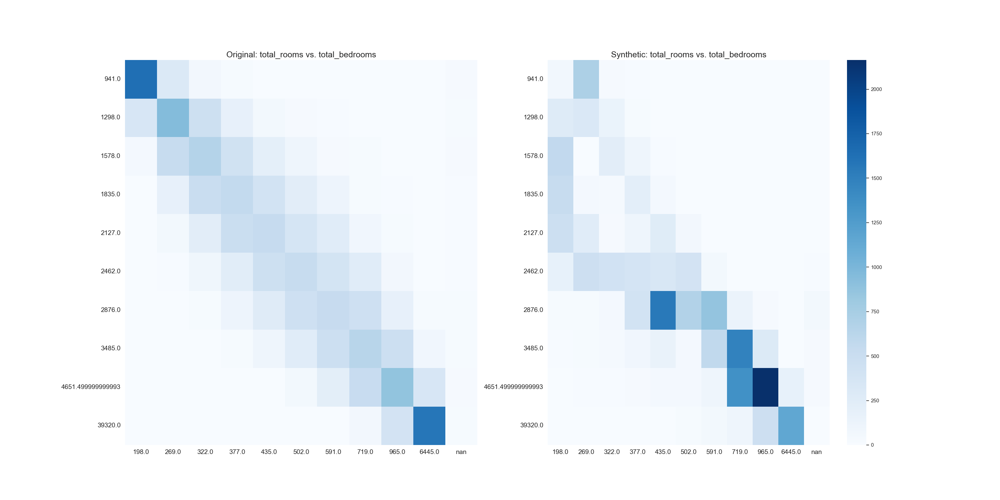
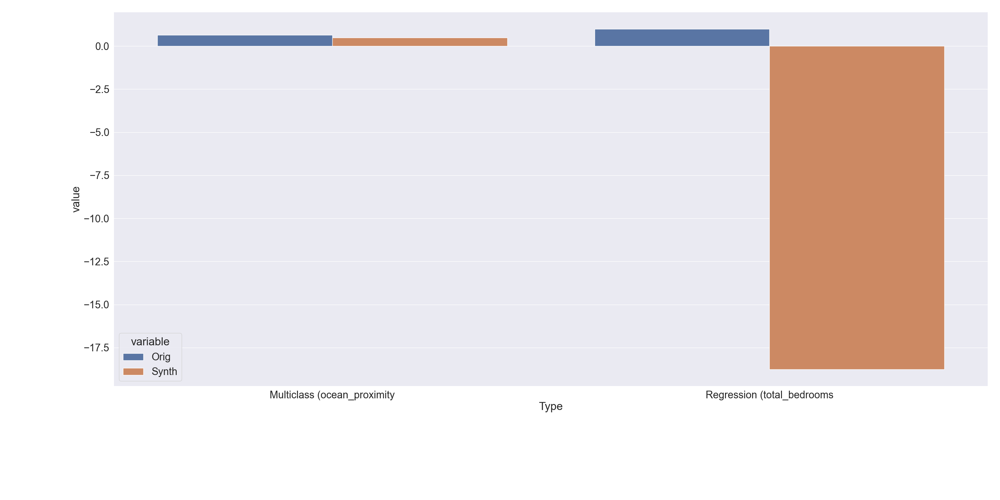

In [133]:
from IPython.display import HTML

HTML(filename="model_artifacts/tmp_store/housing/draws/accuracy_report.html")